<a href="https://colab.research.google.com/github/Geethika1205/Generative_AI_2025/blob/main/Copy_of_generative_ai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving image1.jpg to image1.jpg


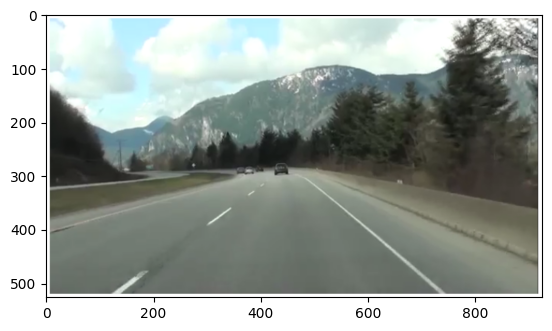

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = list(uploaded.keys())[0]
img = mpimg.imread("/content/image1.jpg")
plt.imshow(img)
plt.axis('on')
plt.show()


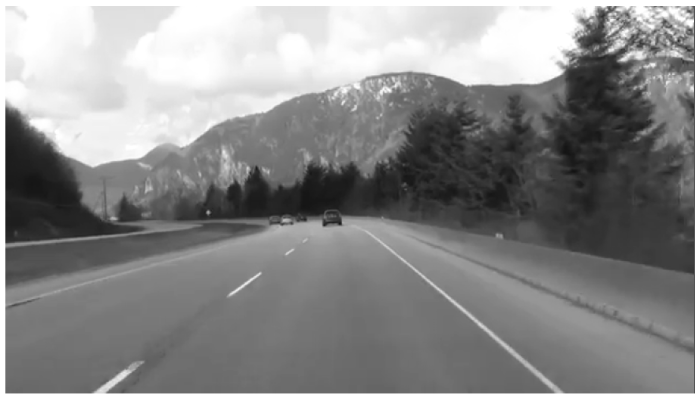

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = list(uploaded.keys())[0]  # Get uploaded file name
img = cv2.imread(image_path)  # Read image

# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Resize image to a manageable size (e.g., width=500 pixels while keeping aspect ratio)
height, width = gray_img.shape
new_width = 700
new_height = int((new_width / width) * height)
resized_gray = cv2.resize(gray_img, (new_width, new_height))

# Display the resized grayscale image
cv2_imshow(resized_gray)


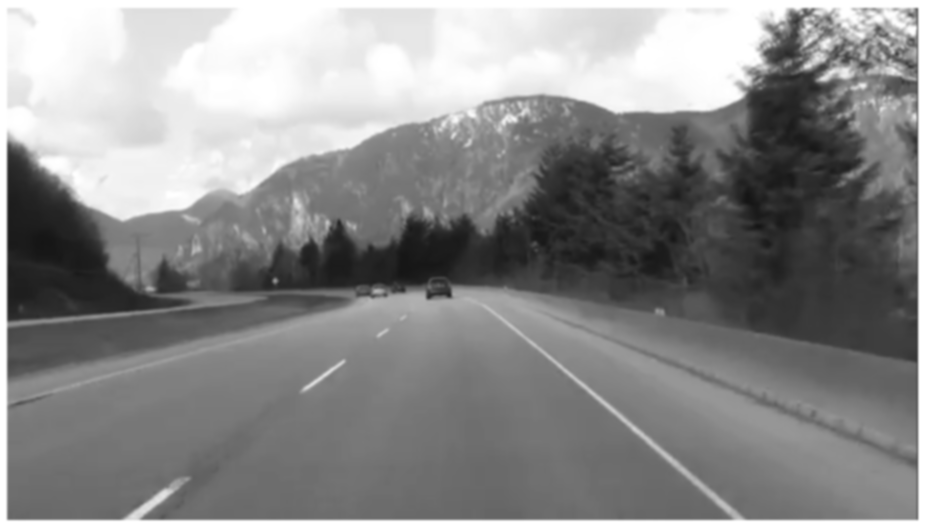

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = list(uploaded.keys())[0]  # Get uploaded file name
img = cv2.imread(image_path)  # Read image

# Convert to grayscale (optional, depends on your need)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur
blurred_img = cv2.GaussianBlur(gray_img, (5, 5), 0)  # (kernel_size = 5x5), sigmaX = 0

# Display the blurred image
cv2_imshow(blurred_img)


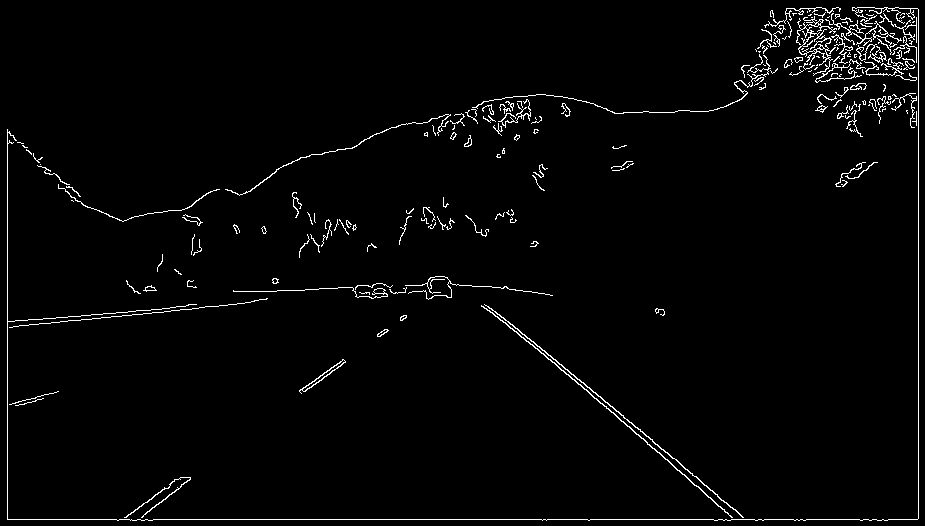

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = list(uploaded.keys())[0]  # Get uploaded file name
img = cv2.imread("/content/image1.jpg")  # Read image

# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Canny Edge Detection
edges = cv2.Canny(gray_img, threshold1=100, threshold2=200)

# Display the edge-detected image
cv2_imshow(edges)


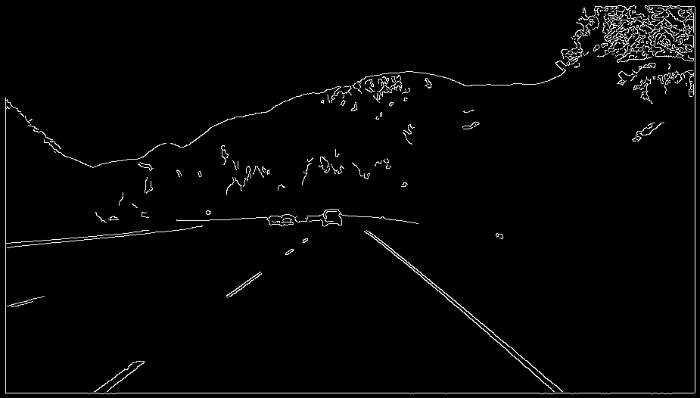

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = list(uploaded.keys())[0]  # Get uploaded file name
img = cv2.imread("/content/image1.jpg")  # Read image

# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Canny Edge Detection
edges = cv2.Canny(gray_img, threshold1=100, threshold2=200)

# Resize the edge-detected image to a manageable size
height, width = edges.shape
new_width = 700
  # Set desired width
new_height = int((new_width / width) * height)  # Keep aspect ratio
resized_edges = cv2.resize(edges, (new_width, new_height))

# Display the resized edge-detected image
cv2_imshow(resized_edges)


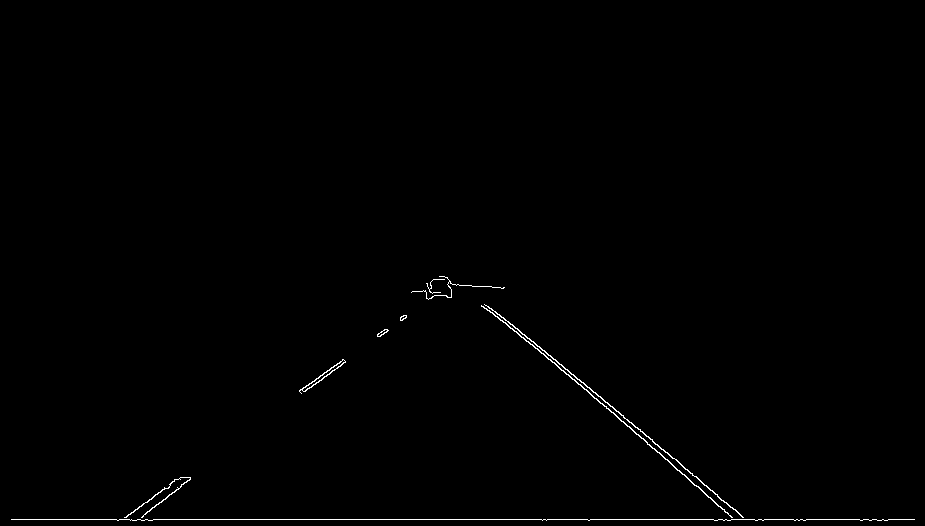

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
image_path = "/mnt/data/Screenshot 2025-02-07 181324.png"  # Your uploaded image
img = cv2.imread("/content/image1.jpg")

# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Canny Edge Detection
edges = cv2.Canny(gray_img, 100, 200)

# Get image dimensions
height, width = edges.shape

# Define a triangular region focusing on the road
roi_vertices = np.array([[
    (0, height),          # Bottom-left corner
    (width // 2, height // 2),  # Middle top
    (width, height)       # Bottom-right corner
]], dtype=np.int32)

# Create a black mask
mask = np.zeros_like(edges)

# Fill the ROI with white
cv2.fillPoly(mask, roi_vertices, 255)

# Apply the mask to extract the ROI
roi_edges = cv2.bitwise_and(edges, mask)

# Display the extracted ROI
cv2_imshow(roi_edges)


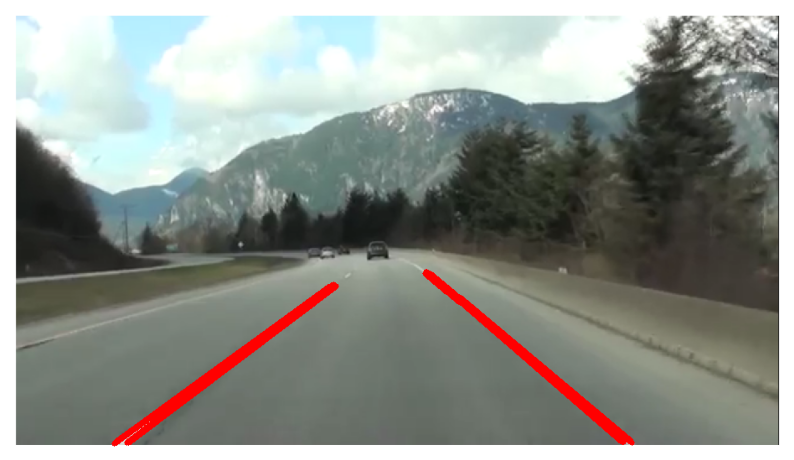

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/image1.jpg"
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Canny edge detection
edges = cv2.Canny(blurred, 50, 150)

# Define region of interest (ROI)
def region_of_interest(img):
    height, width = img.shape
    mask = np.zeros_like(img)

    # Define a polygon to mask everything except the lane area
    polygon = np.array([
        [(50, height), (width // 2 - 150, height // 2 + 50), (width // 2 + 150, height // 2 + 50), (width - 50, height)]
    ], np.int32)

    cv2.fillPoly(mask, polygon, 255)
    masked_img = cv2.bitwise_and(img, mask)
    return masked_img

masked_edges = region_of_interest(edges)

# Apply Hough Line Transform
lines = cv2.HoughLinesP(masked_edges, 1, np.pi / 180, threshold=20, minLineLength=20, maxLineGap=200)

# Separate left and right lane lines
def separate_lines(lines, width):
    left_lines = []
    right_lines = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1) if (x2 - x1) != 0 else 0
            if slope < -0.2:
                left_lines.append(line[0])
            elif slope > 0.2:
                right_lines.append(line[0])
    return left_lines, right_lines

left_lines, right_lines = separate_lines(lines, image.shape[1])

# Draw the detected lane lines on the image
for line in left_lines + right_lines:
    x1, y1, x2, y2 = line
    cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 5)

# Convert BGR image to RGB for displaying in matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the result
plt.figure(figsize=(10, 6))
plt.imshow(image_rgb)
plt.axis("off")
plt.show()


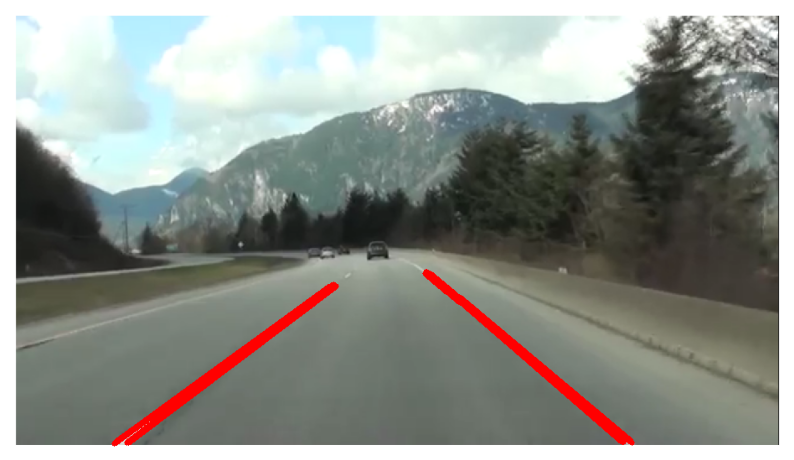

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/image1.jpg"
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Canny edge detection
edges = cv2.Canny(blurred, 50, 150)

# Define region of interest (ROI)
def region_of_interest(img):
    height, width = img.shape
    mask = np.zeros_like(img)

    # Define a polygon to mask everything except the lane area
    polygon = np.array([
        [(50, height), (width // 2 - 150, height // 2 + 50), (width // 2 + 150, height // 2 + 50), (width - 50, height)]
    ], np.int32)

    cv2.fillPoly(mask, polygon, 255)
    masked_img = cv2.bitwise_and(img, mask)
    return masked_img

masked_edges = region_of_interest(edges)

# Apply Hough Line Transform
lines = cv2.HoughLinesP(masked_edges, 1, np.pi / 180, threshold=20, minLineLength=20, maxLineGap=200)

# Separate left and right lane lines
def separate_lines(lines, width):
    left_lines = []
    right_lines = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1) if (x2 - x1) != 0 else 0
            if slope < -0.2:
                left_lines.append(line[0])
            elif slope > 0.2:
                right_lines.append(line[0])
    return left_lines, right_lines

left_lines, right_lines = separate_lines(lines, image.shape[1])

# Draw the detected lane lines on the image
for line in left_lines + right_lines:
    x1, y1, x2, y2 = line
    cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 5)

# Convert BGR image to RGB for displaying in matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the result
plt.figure(figsize=(10, 6))
plt.imshow(image_rgb)
plt.axis("off")
plt.show()


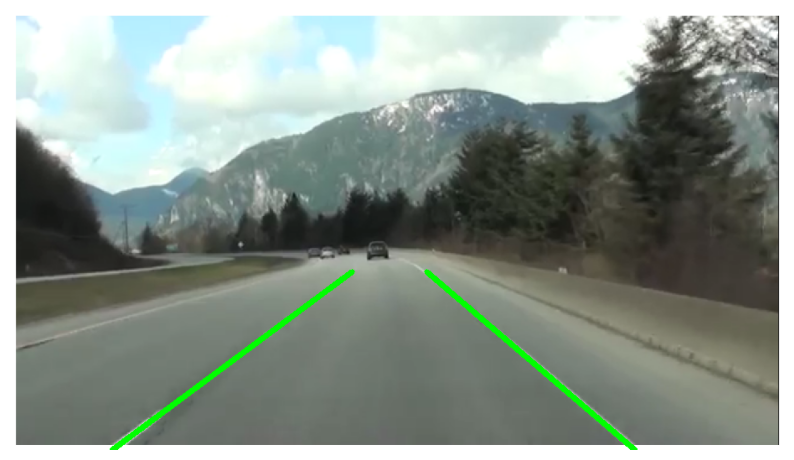

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/image1.jpg"
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Canny edge detection
edges = cv2.Canny(blurred, 50, 150)

# Define region of interest (ROI)
def region_of_interest(img):
    height, width = img.shape
    mask = np.zeros_like(img)

    polygon = np.array([
        [(50, height), (width // 2 - 150, height // 2 + 50), (width // 2 + 150, height // 2 + 50), (width - 50, height)]
    ], np.int32)

    cv2.fillPoly(mask, polygon, 255)
    masked_img = cv2.bitwise_and(img, mask)
    return masked_img

masked_edges = region_of_interest(edges)

# Apply Hough Line Transform
lines = cv2.HoughLinesP(masked_edges, 1, np.pi / 180, threshold=20, minLineLength=20, maxLineGap=200)

# Function to average and extrapolate lane lines
def extrapolate_lines(image, lines):
    left_lines, right_lines = [], []
    left_weights, right_weights = [], []

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1) if (x2 - x1) != 0 else 0
            intercept = y1 - slope * x1
            length = np.sqrt((y2 - y1) ** 2 + (x2 - x1) ** 2)

            if slope < -0.2:
                left_lines.append((slope, intercept))
                left_weights.append(length)
            elif slope > 0.2:
                right_lines.append((slope, intercept))
                right_weights.append(length)

    def average_lane(lines, weights, y_min, y_max):
        if len(lines) > 0:
            avg_slope = np.dot(weights, [l[0] for l in lines]) / np.sum(weights)
            avg_intercept = np.dot(weights, [l[1] for l in lines]) / np.sum(weights)
            x_min = int((y_min - avg_intercept) / avg_slope)
            x_max = int((y_max - avg_intercept) / avg_slope)
            return [(x_min, y_min, x_max, y_max)]
        return []

    height, _ = image.shape[:2]
    y_min, y_max = height // 2 + 50, height  # Define y-range of lane lines
    left_lane = average_lane(left_lines, left_weights, y_min, y_max)
    right_lane = average_lane(right_lines, right_weights, y_min, y_max)

    return left_lane + right_lane

# Extrapolate lane lines
extrapolated_lines = extrapolate_lines(image, lines)

# Draw the detected lane lines
for line in extrapolated_lines:
    x1, y1, x2, y2 = line
    cv2.line(image, (x1, y1), (x2, y2), (0, 255, 0), 5)  # Green color for lane lines

# Convert BGR image to RGB for displaying in matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the result
plt.figure(figsize=(10, 6))
plt.imshow(image_rgb)
plt.axis("off")
plt.show()


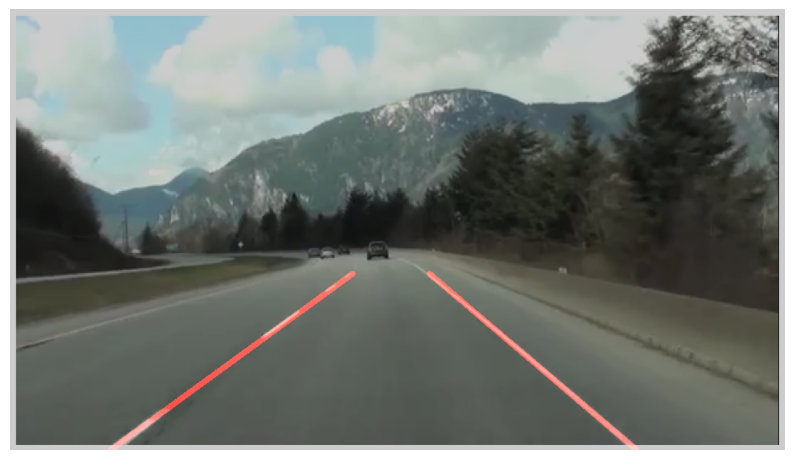

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_canny(image):
    """Convert image to grayscale, apply Gaussian Blur and Canny Edge Detection."""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blur, 40, 120)  # Lower thresholds to detect faint lines
    return edges

def region_of_interest(edges):
    """Define a region of interest to filter unnecessary edges."""
    height, width = edges.shape
    mask = np.zeros_like(edges)
    polygon = np.array([[
        (int(width * 0.1), height),
        (int(width * 0.45), int(height * 0.6)),
        (int(width * 0.55), int(height * 0.6)),
        (int(width * 0.9), height)
    ]], np.int32)
    cv2.fillPoly(mask, polygon, 255)
    return cv2.bitwise_and(edges, mask)

def detect_lines(image):
    """Detect lane lines using improved Hough Transform."""
    edges = apply_canny(image)
    roi_edges = region_of_interest(edges)

    # Increase maxLineGap to connect dashed lines better
    lines = cv2.HoughLinesP(roi_edges, 1, np.pi / 180, 30, minLineLength=50, maxLineGap=200)
    return lines

def draw_lines(image, lines):
    """Draw lane lines on the original image."""
    line_image = np.zeros_like(image)
    if lines is not None:
        left_lines = []
        right_lines = []
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1 + 1e-6)  # Avoid division by zero
            if slope < -0.3:  # Left lane
                left_lines.append((x1, y1, x2, y2))
            elif slope > 0.3:  # Right lane
                right_lines.append((x1, y1, x2, y2))

        def extrapolate_line(lines):
            if len(lines) == 0:
                return None
            x_coords = []
            y_coords = []
            for x1, y1, x2, y2 in lines:
                x_coords.extend([x1, x2])
                y_coords.extend([y1, y2])
            poly = np.polyfit(x_coords, y_coords, 1)
            y1 = image.shape[0]  # Bottom of the image
            y2 = int(y1 * 0.6)  # Slightly above center
            x1 = int((y1 - poly[1]) / poly[0])
            x2 = int((y2 - poly[1]) / poly[0])
            return x1, y1, x2, y2

        left_lane = extrapolate_line(left_lines)
        right_lane = extrapolate_line(right_lines)

        if left_lane:
            cv2.line(line_image, (left_lane[0], left_lane[1]), (left_lane[2], left_lane[3]), (255, 0, 0), 5)
        if right_lane:
            cv2.line(line_image, (right_lane[0], right_lane[1]), (right_lane[2], right_lane[3]), (255, 0, 0), 5)

    return cv2.addWeighted(image, 0.8, line_image, 1, 0)

# Load the image
image_path = "/content/image1.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Process and display the result
lines = detect_lines(image)
result = draw_lines(image, lines)

plt.figure(figsize=(10, 6))
plt.imshow(result)
plt.axis("off")
plt.show()


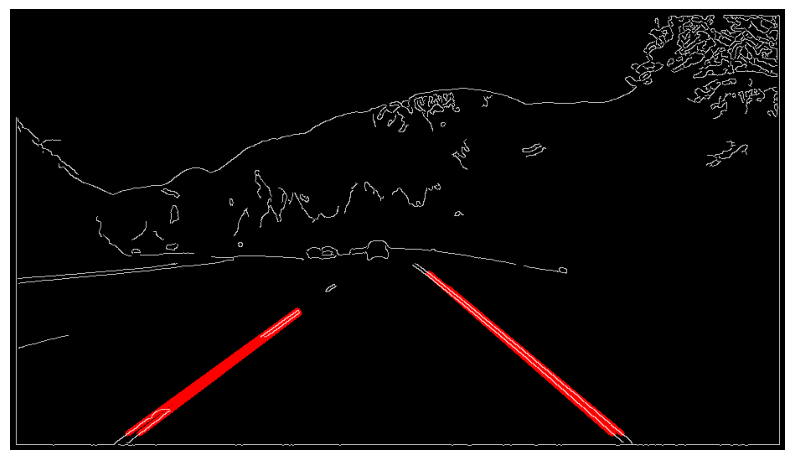

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_canny(image):
    """Convert image to grayscale, apply Gaussian Blur, and detect edges using Canny."""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blur, 50, 150)
    return edges

def region_of_interest(edges):
    """Create a mask to focus on the road region, avoiding the bottom border."""
    height, width = edges.shape
    mask = np.zeros_like(edges)
    polygon = np.array([[
        (int(width * 0.1), height - 20),  # Avoid bottom 20 pixels
        (int(width * 0.45), int(height * 0.6)),
        (int(width * 0.55), int(height * 0.6)),
        (int(width * 0.9), height - 20)
    ]], np.int32)
    cv2.fillPoly(mask, polygon, 255)
    return cv2.bitwise_and(edges, mask)

def detect_lines(image):
    """Detect lane lines using the Hough Transform."""
    edges = apply_canny(image)
    roi_edges = region_of_interest(edges)

    # Hough Transform to detect lane segments
    lines = cv2.HoughLinesP(roi_edges, 1, np.pi / 180, 50, minLineLength=80, maxLineGap=150)
    return edges, lines

def draw_red_lines(image, edges, lines):
    """Draw lane lines in red on the edge-detected image, filtering out horizontal lines."""
    line_image = np.zeros_like(image)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1) if (x2 - x1) != 0 else 0
            if abs(slope) > 0.3:  # Ignore horizontal lines
                cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 5)  # Red color

    # Merge edge-detected image with red lane lines
    lane_overlay = cv2.addWeighted(cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR), 0.8, line_image, 1, 0)
    return lane_overlay

# Load the image
image_path = "/content/image1.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Process and display the result
edges, lines = detect_lines(image)
result = draw_red_lines(image, edges, lines)

plt.figure(figsize=(10, 6))
plt.imshow(result)
plt.axis("off")
plt.show()



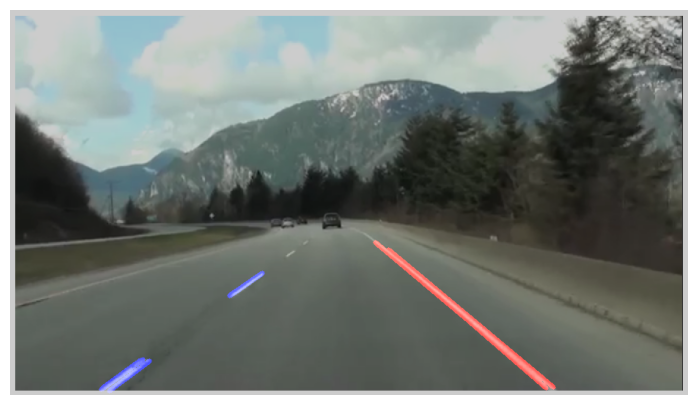

Processed image saved at: /mnt/data/refined_lane_detected.png


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def region_of_interest(img):
    h, w = img.shape[:2]
    mask = np.zeros_like(img)
    roi_vertices = np.array([[(w * 0.1, h), (w * 0.4, h * 0.6), (w * 0.6, h * 0.6), (w * 0.9, h)]], dtype=np.int32)
    cv2.fillPoly(mask, roi_vertices, 255)
    return cv2.bitwise_and(img, mask)

def filter_lines(lines):
    left_lines, right_lines = [], []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1 + 1e-6)
            if 0.5 < abs(slope) < 2.0:
                if slope < 0:
                    left_lines.append(line[0])
                else:
                    right_lines.append(line[0])
    return left_lines, right_lines

def draw_lanes(img, left_lines, right_lines):
    lane_image = np.zeros_like(img)
    for x1, y1, x2, y2 in left_lines:
        cv2.line(lane_image, (x1, y1), (x2, y2), (255, 0, 0), 5)
    for x1, y1, x2, y2 in right_lines:
        cv2.line(lane_image, (x1, y1), (x2, y2), (0, 0, 255), 5)
    return cv2.addWeighted(img, 0.8, lane_image, 1, 0)

# Load image
image_path = "/content/image1.jpg"
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
edges = cv2.Canny(blurred, 50, 150)

# Apply ROI and Hough Transform
roi_edges = region_of_interest(edges)
lines = cv2.HoughLinesP(roi_edges, 1, np.pi / 180, 50, minLineLength=40, maxLineGap=25)
left_lines, right_lines = filter_lines(lines)

# Draw detected lanes
result = draw_lanes(image, left_lines, right_lines)
output_path = "/mnt/data/refined_lane_detected.png"
cv2.imwrite(output_path, result)

# Display result
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

print("Processed image saved at:", output_path)


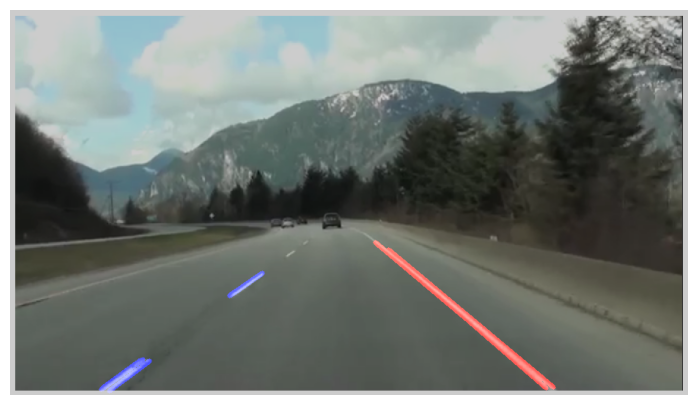

Processed image saved at: /mnt/data/refined_lane_detected.png


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def region_of_interest(img):
    h, w = img.shape[:2]
    mask = np.zeros_like(img)
    roi_vertices = np.array([[(w * 0.1, h), (w * 0.4, h * 0.6), (w * 0.6, h * 0.6), (w * 0.9, h)]], dtype=np.int32)
    cv2.fillPoly(mask, roi_vertices, 255)
    return cv2.bitwise_and(img, mask)

def filter_lines(lines):
    left_lines, right_lines = [], []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1 + 1e-6)
            if 0.5 < abs(slope) < 2.0:
                if slope < 0:
                    left_lines.append(line[0])
                else:
                    right_lines.append(line[0])
    return left_lines, right_lines

def draw_lanes(img, left_lines, right_lines):
    lane_image = np.zeros_like(img)
    for x1, y1, x2, y2 in left_lines:
        cv2.line(lane_image, (x1, y1), (x2, y2), (255, 0, 0), 5)
    for x1, y1, x2, y2 in right_lines:
        cv2.line(lane_image, (x1, y1), (x2, y2), (0, 0, 255), 5)
    return cv2.addWeighted(img, 0.8, lane_image, 1, 0)

# Load image
image_path = "/content/image1.jpg"
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
edges = cv2.Canny(blurred, 50, 150)

# Apply ROI and Hough Transform
roi_edges = region_of_interest(edges)
lines = cv2.HoughLinesP(roi_edges, 1, np.pi / 180, 50, minLineLength=40, maxLineGap=25)
left_lines, right_lines = filter_lines(lines)

# Draw detected lanes
result = draw_lanes(image, left_lines, right_lines)
output_path = "/mnt/data/refined_lane_detected.png"
cv2.imwrite(output_path, result)

# Display result
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

print("Processed image saved at:", output_path)


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving curve road image.jpg to curve road image.jpg


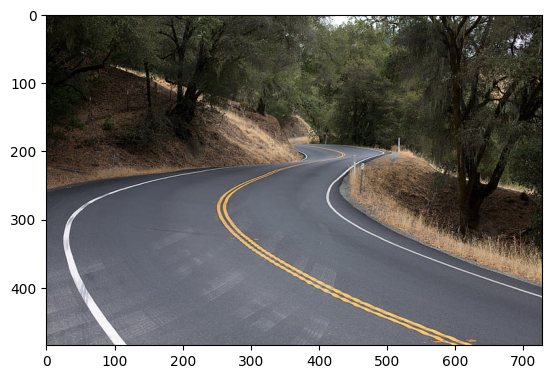

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = list(uploaded.keys())[0]
img = mpimg.imread("/content/curve road image.jpg")
plt.imshow(img)
plt.axis('on')
plt.show()


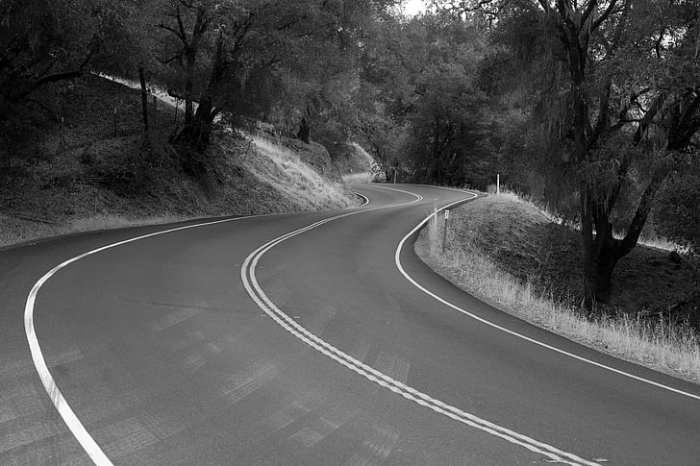

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = list(uploaded.keys())[0]  # Get uploaded file name
img = cv2.imread(image_path)  # Read image

# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


# Resize image to a manageable size (e.g., width=500 pixels while keeping aspect ratio)
height, width = gray_img.shape
new_width = 700
new_height = int((new_width / width) * height)
resized_gray = cv2.resize(gray_img, (new_width, new_height))

# Display the resized grayscale image
cv2_imshow(resized_gray)


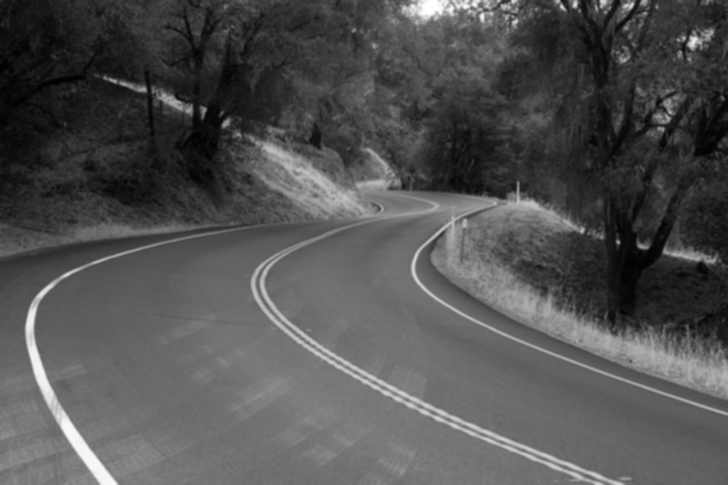

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = list(uploaded.keys())[0]  # Get uploaded file name
img = cv2.imread(image_path)  # Read image

# Convert to grayscale (optional, depends on your need)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur
blurred_img = cv2.GaussianBlur(gray_img, (5, 5), 0)  # (kernel_size = 5x5), sigmaX = 0

# Display the blurred image
cv2_imshow(blurred_img)


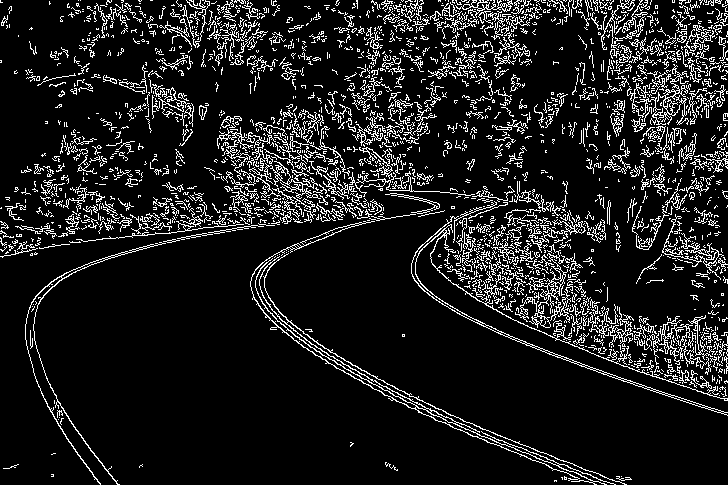

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = list(uploaded.keys())[0]  # Get uploaded file name
img = cv2.imread("/content/curve road image.jpg")  # Read image

# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Canny Edge Detection
edges = cv2.Canny(gray_img, threshold1=100, threshold2=200)

# Display the edge-detected image
cv2_imshow(edges)


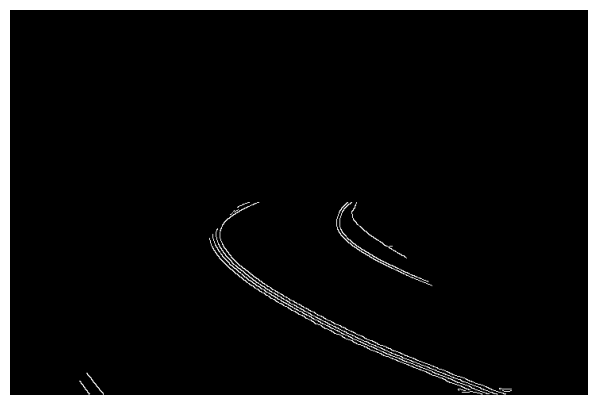

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def region_of_interest(img):
    h, w = img.shape[:2]
    mask = np.zeros_like(img)

    # Define ROI vertices for a curved road (wider capture)
    roi_vertices = np.array([
        [(w * 0.1, h), (w * 0.4, h * 0.5),
         (w * 0.6, h * 0.5), (w * 0.9, h)]
    ], dtype=np.int32)

    cv2.fillPoly(mask, [roi_vertices], 255)
    return cv2.bitwise_and(img, mask)

# **Provide your image path here**
image_path = "/content/curve road image.jpg"  # Change this to your image file
image = cv2.imread(image_path)

if image is None:
    print("Error: Image not found! Check the path.")
else:
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)

    # Apply ROI
    roi_edges = region_of_interest(edges)

    # Display result
    plt.figure(figsize=(10, 5))
    plt.imshow(roi_edges, cmap='gray')
    plt.axis("off")
    plt.show()


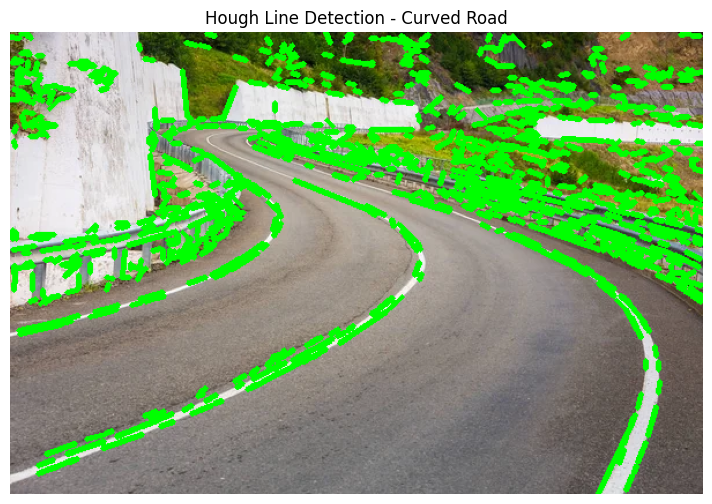

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/curve road.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian blur to smooth edges
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Canny edge detection
edges = cv2.Canny(blurred, 50, 150)

# Apply Hough Line Transform
lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/90, threshold=5, minLineLength=5, maxLineGap=2)

# Create a copy of the original image to draw lines
line_image = np.copy(image)

# Draw detected lines
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), thickness=4)  # Green color for lines

# Display the result
plt.figure(figsize=(10, 6))
plt.imshow(line_image)
plt.axis('off')
plt.title("Hough Line Detection - Curved Road")
plt.show()


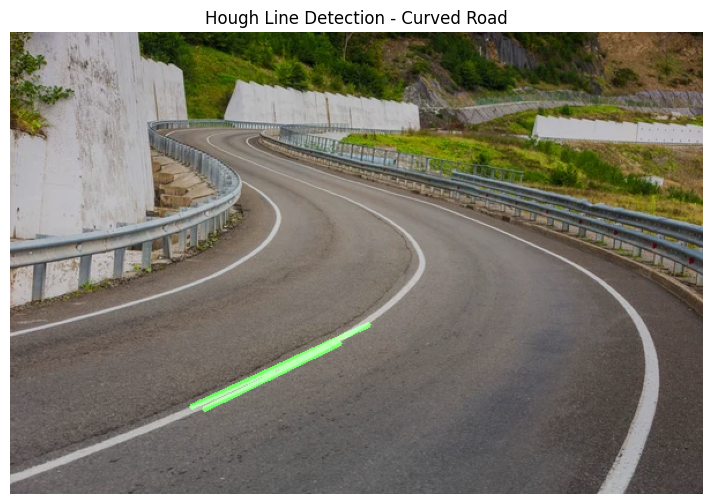

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('/content/curve road.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Canny Edge Detection with optimized thresholds
edges = cv2.Canny(blurred, 100, 200)

# Define Region of Interest (ROI) - Focus only on road
def region_of_interest(image):
    height, width = image.shape
    mask = np.zeros_like(image)

    # Define a polygon for the road region
    polygon = np.array([[
        (100, height),   # Bottom-left
        (width - 100, height),  # Bottom-right
        (width // 2 + 150, height // 2),  # Top-right
        (width // 2 - 150, height // 2)  # Top-left
    ]], np.int32)

    cv2.fillPoly(mask, polygon, 255)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

# Apply ROI
edges_roi = region_of_interest(edges)

# Apply Hough Line Transform with optimized parameters
lines = cv2.HoughLinesP(edges_roi, rho=1, theta=np.pi/180, threshold=80, minLineLength=100, maxLineGap=50)

# Draw detected lines
line_image = np.zeros_like(image)

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 3)  # Green lines

# Overlay detected lines on original image
final_image = cv2.addWeighted(image, 0.8, line_image, 1, 0)

# Show the result
plt.figure(figsize=(10, 6))
plt.imshow(final_image)
plt.title("Hough Line Detection - Curved Road")
plt.axis("off")
plt.show()


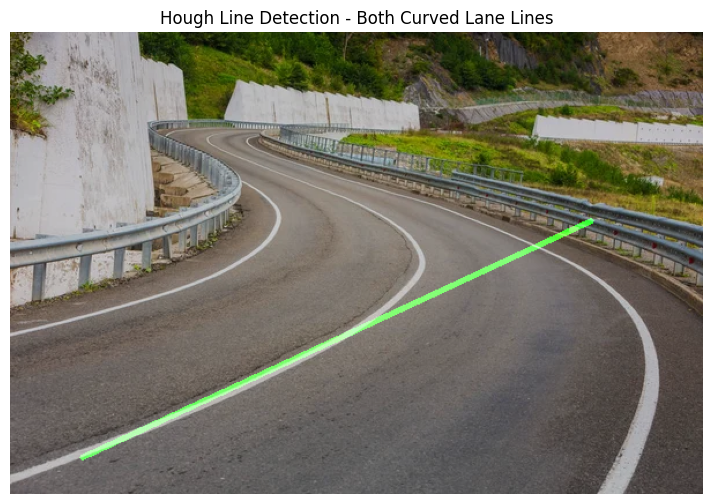

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('/content/curve road.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Canny Edge Detection with optimized thresholds
edges = cv2.Canny(blurred, 80, 200)  # Lowered min threshold to detect both lanes

# Define Region of Interest (ROI) - Focus only on road
def region_of_interest(image):
    height, width = image.shape
    mask = np.zeros_like(image)

    # Define a polygon to cover both lanes
    polygon = np.array([[
        (50, height),   # Bottom-left
        (width - 50, height),  # Bottom-right
        (width // 2 + 200, height // 2 - 50),  # Top-right
        (width // 2 - 200, height // 2 - 50)  # Top-left
    ]], np.int32)

    cv2.fillPoly(mask, polygon, 255)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

# Apply ROI
edges_roi = region_of_interest(edges)

# Apply Hough Line Transform with optimized parameters
lines = cv2.HoughLinesP(edges_roi, rho=1, theta=np.pi/180, threshold=100, minLineLength=200, maxLineGap=150)

# Draw detected lines
line_image = np.zeros_like(image)

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 4)  # Green lines

# Overlay detected lines on original image
final_image = cv2.addWeighted(image, 0.8, line_image, 1, 0)

# Show the result
plt.figure(figsize=(10, 6))
plt.imshow(final_image)
plt.title("Hough Line Detection - Both Curved Lane Lines")
plt.axis("off")
plt.show()


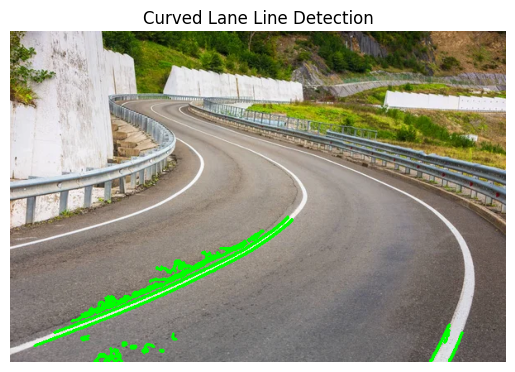

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread("/content/curve road.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Detect edges using Canny Edge Detector
edges = cv2.Canny(blurred, 20, 100)

# Define region of interest
height, width = edges.shape
mask = np.zeros_like(edges)
polygon = np.array([[
    (0, height), (width, height), (width//2, height//2)
]], np.int32)
cv2.fillPoly(mask, polygon, 255)
masked_edges = cv2.bitwise_and(edges, mask)

# Find contours instead of Hough lines for curve detection
contours, _ = cv2.findContours(masked_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw the detected curves
output = image.copy()
cv2.drawContours(output, contours, -1, (0, 255, 0), 2)

# Show result
plt.imshow(output)
plt.title("Curved Lane Line Detection")
plt.axis("off")
plt.show()


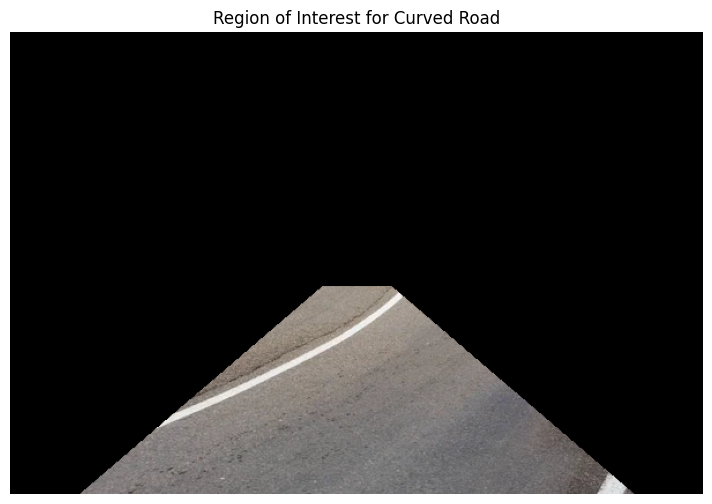

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/curve road.jpg"  # Path to your uploaded image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

# Get image dimensions
height, width = image.shape[:2]

# Define a polygonal Region of Interest (ROI) for a curved road
roi_vertices = np.array([[
    (int(width * 0.1), height),  # Bottom-left corner
    (int(width * 0.45), int(height * 0.55)),  # Mid-left curve
    (int(width * 0.55), int(height * 0.55)),  # Mid-right curve
    (int(width * 0.9), height)  # Bottom-right corner
]], dtype=np.int32)

# Create a mask
mask = np.zeros_like(image[:, :, 0])  # Single channel mask
cv2.fillPoly(mask, roi_vertices, 255)  # Fill the ROI with white

# Apply the mask
masked_image = cv2.bitwise_and(image, image, mask=mask)

# Display the result
plt.figure(figsize=(10, 6))
plt.imshow(masked_image)
plt.title("Region of Interest for Curved Road")
plt.axis("off")
plt.show()


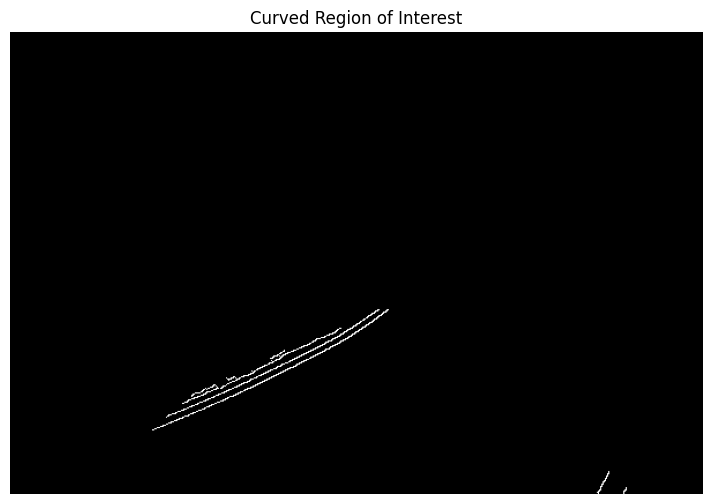

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/curve road.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur to smooth edges
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Use Canny Edge Detection
edges = cv2.Canny(blurred, 50, 150)

# Get image dimensions
height, width = edges.shape

# Create a blank mask for ROI
mask = np.zeros_like(edges)

# Define curved region of interest (Using an approximate polynomial shape)
roi_vertices = np.array([
    [int(width * 0.1), height],  # Bottom-left
    [int(width * 0.4), int(height * 0.6)],  # Mid-left curve
    [int(width * 0.6), int(height * 0.6)],  # Mid-right curve
    [int(width * 0.9), height]  # Bottom-right
], dtype=np.int32)

# Draw a curve using cv2.fillPoly
cv2.fillPoly(mask, [roi_vertices], 255)

# Apply the mask to keep only the ROI
masked_edges = cv2.bitwise_and(edges, mask)

# Display results
plt.figure(figsize=(10, 6))
plt.imshow(masked_edges, cmap='gray')
plt.title("Curved Region of Interest")
plt.axis("off")
plt.show()


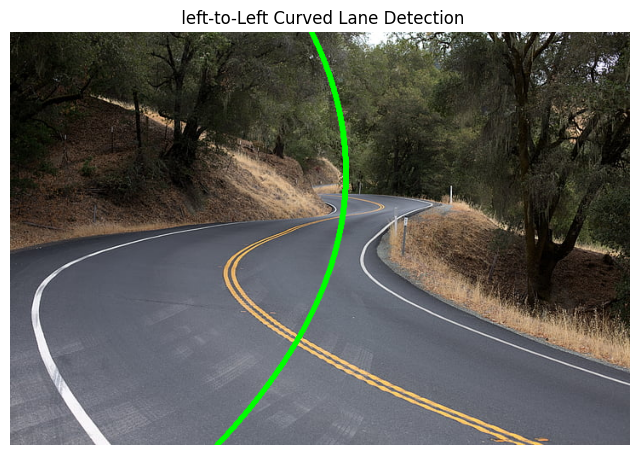

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread("/content/curve road image.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Adaptive Canny Edge Detection (Automatic thresholding)
low_threshold = np.median(gray) * 0.33
high_threshold = np.median(gray) * 1.33
edges = cv2.Canny(gray, int(low_threshold), int(high_threshold))

# Define a **reversed** region of interest (favoring right to left)
height, width = edges.shape
mask = np.zeros_like(edges)

# Adjust ROI for a right-to-left curve
polygon = np.array([[
    (int(width * 0.15), height *1.0),  # Bottom-left (shifted right)
    (int(width * 0.85), height * 1.0),  # Bottom-right (extended more right)
    (int(width * 0.65), int(height * 0.35)),  # Upper-right (shifted more right)
    (int(width * 0.35), int(height * 0.35))   # Upper-left (closer to the left)
]], np.int32)

cv2.fillPoly(mask, [polygon], 100)
masked_edges = cv2.bitwise_and(edges, mask)

# Find lane pixels for polynomial fitting
nonzero = masked_edges.nonzero()
nonzeroy = np.array(nonzero[0])  # y-coordinates
nonzerox = np.array(nonzero[1])  # x-coordinates

# Fit a **2nd-degree polynomial curve (Quadratic)**
if len(nonzerox) > 0:
    curve_fit = np.polyfit(nonzeroy, nonzerox, 2)  # Fitting y = Ax² + Bx + C
    ploty = np.linspace(0, height - 1, height)  # Generate y values
    fitx = curve_fit[0] * ploty**2 + curve_fit[1] * ploty + curve_fit[2]  # Quadratic curve

    # Reverse direction to ensure it moves right to left
    fitx = np.flip(fitx)  # Flipping the x-coordinates

    # Draw lane on the image
    output = image.copy()
    for i in range(len(ploty) - 1):
        cv2.line(output, (int(fitx[i]), int(ploty[i])), (int(fitx[i+1]), int(ploty[i+1])), (0, 255, 0), 5)
else:
    output = image.copy()
    print("Lane not detected properly. Adjust thresholds!")

# Show the result
plt.figure(figsize=(8, 6))
plt.imshow(output)
plt.title(" left-to-Left Curved Lane Detection")
plt.axis("off")
plt.show()


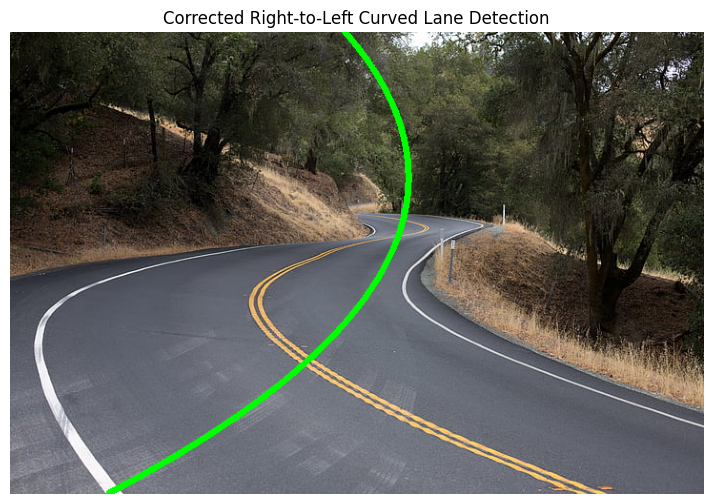

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread("/content/curve road image.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Adaptive Canny Edge Detection (Automatic thresholding)
low_threshold = np.median(gray) * 0.5  # Adjusting for more sensitivity
high_threshold = np.median(gray) * 1.5
edges = cv2.Canny(gray, int(low_threshold), int(high_threshold))

# Define a **corrected** region of interest (ROI)
height, width = edges.shape
mask = np.zeros_like(edges)

# Using optimized width-to-height ratios for proper curve detection
polygon = np.array([[
    (int(width * 0.15), height),   # Bottom-left
    (int(width * 0.85), height),   # Bottom-right
    (int(width * 0.65), int(height * 0.35)),  # Upper-right
    (int(width * 0.35), int(height * 0.35))   # Upper-left
]], np.int32)

cv2.fillPoly(mask, [polygon], 255)
masked_edges = cv2.bitwise_and(edges, mask)

# Find lane pixels for polynomial fitting
nonzero = masked_edges.nonzero()
nonzeroy = np.array(nonzero[0])  # y-coordinates
nonzerox = np.array(nonzero[1])  # x-coordinates

# Fit a **2nd-degree polynomial curve (Quadratic)**
if len(nonzerox) > 0:
    curve_fit = np.polyfit(nonzeroy, nonzerox, 2)  # Fitting y = Ax² + Bx + C
    ploty = np.linspace(0, height - 1, height)  # Generate y values
    fitx = curve_fit[0] * ploty**2 + curve_fit[1] * ploty + curve_fit[2]  # Quadratic curve

    # Reverse direction to ensure it moves **right to left**
    fitx = np.flip(fitx)

    # Draw the detected lane curve on the image
    output = image.copy()
    for i in range(len(ploty) - 1):
        cv2.line(output, (int(fitx[i]), int(ploty[i])), (int(fitx[i+1]), int(ploty[i+1])), (0, 255, 0), 5)
else:
    output = image.copy()
    print("⚠ Lane not detected properly. Adjust thresholds!")

# Show the result
plt.figure(figsize=(10, 6))
plt.imshow(output)
plt.title("Corrected Right-to-Left Curved Lane Detection")
plt.axis("off")
plt.show()


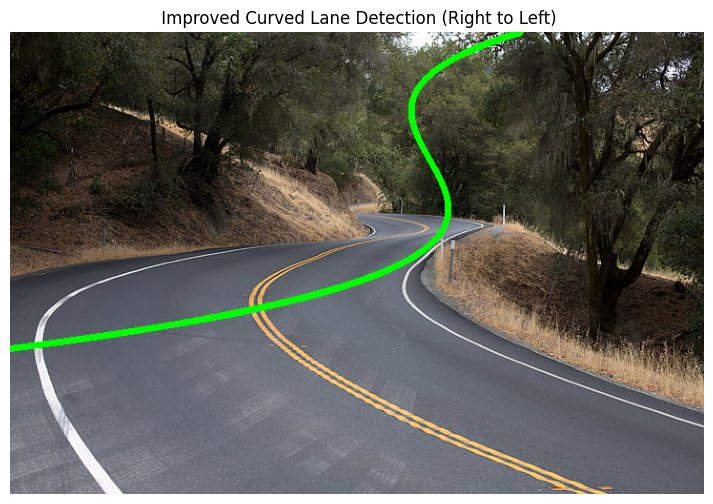

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the image
image = cv2.imread("/content/curve road image.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(gray, (7, 7), 1)  # Increased kernel size for smoother edges

# Apply Adaptive Canny Edge Detection
low_threshold = np.median(blurred) * 0.6  # Increased lower threshold
high_threshold = np.median(blurred) * 1.8  # Increased upper threshold
edges = cv2.Canny(blurred, int(low_threshold), int(high_threshold))

# Define an improved Region of Interest (ROI)
height, width = edges.shape
mask = np.zeros_like(edges)

# New ROI to focus only on lane markings
polygon = np.array([[
    (int(width * 0.1), height),     # Bottom-left
    (int(width * 0.9), height),     # Bottom-right
    (int(width * 0.75), int(height * 0.45)),  # Upper-right
    (int(width * 0.25), int(height * 0.45))   # Upper-left
]], np.int32)

cv2.fillPoly(mask, [polygon], 255)
masked_edges = cv2.bitwise_and(edges, mask)

# Find lane pixels for curve fitting
nonzero = masked_edges.nonzero()
nonzeroy = np.array(nonzero[0])  # y-coordinates
nonzerox = np.array(nonzero[1])  # x-coordinates

# Fit a **3rd-degree polynomial curve** for more accurate lane detection
if len(nonzerox) > 0:
    curve_fit = np.polyfit(nonzeroy, nonzerox, 3)  # Fitting y = Ax³ + Bx² + Cx + D
    ploty = np.linspace(0, height - 1, height)  # Generate y values
    fitx = (curve_fit[0] * ploty**3) + (curve_fit[1] * ploty**2) + (curve_fit[2] * ploty) + curve_fit[3]

    # Ensure curve follows the correct **right-to-left** direction
    fitx = np.flip(fitx)

    # Draw the detected lane curve on the image
    output = image.copy()
    for i in range(len(ploty) - 1):
        cv2.line(output, (int(fitx[i]), int(ploty[i])), (int(fitx[i+1]), int(ploty[i+1])), (0, 255, 0), 5)
else:
    output = image.copy()
    print(" Lane not detected properly. Try adjusting thresholds.")

# Show the result
plt.figure(figsize=(10, 6))
plt.imshow(output)
plt.title(" Improved Curved Lane Detection (Right to Left)")
plt.axis("off")
plt.show()


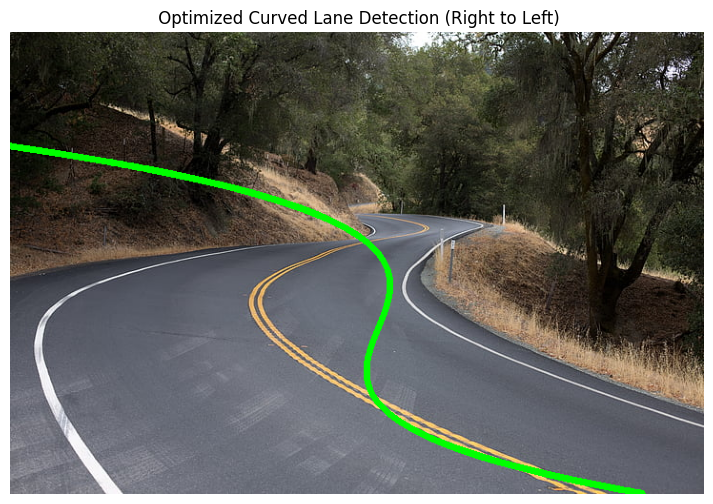

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the image
image = cv2.imread("/content/curve road image.jpg")  # Corrected path
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur (Reduced kernel size for sharper edges)
blurred = cv2.GaussianBlur(gray, (5, 5), 1)

# Adjusted Canny Edge Detection Thresholds
low_threshold = np.median(blurred) * 0.5  # Reduced lower threshold to capture faint lane lines
high_threshold = np.median(blurred) * 1.5  # Reduced upper threshold slightly
edges = cv2.Canny(blurred, int(low_threshold), int(high_threshold))

# Define a more accurate Region of Interest (ROI)
height, width = edges.shape
mask = np.zeros_like(edges)

# Adjusted ROI polygon to focus better on lanes
polygon = np.array([[
    (int(width * 0.2), height),   # Bottom-left (shifted to avoid shadows)
    (int(width * 0.8), height),   # Bottom-right (keeps the right lane)
    (int(width * 0.65), int(height * 0.4)),  # Upper-right (better aligns with lane curvature)
    (int(width * 0.35), int(height * 0.4))   # Upper-left (ensures left lane capture)
]], np.int32)

cv2.fillPoly(mask, [polygon], 255)
masked_edges = cv2.bitwise_and(edges, mask)

# Find lane pixels for polynomial fitting
nonzero = masked_edges.nonzero()
nonzeroy = np.array(nonzero[0])  # y-coordinates
nonzerox = np.array(nonzero[1])  # x-coordinates

# Fit a **3rd-degree polynomial curve** for smooth lane detection
if len(nonzerox) > 0:
    curve_fit = np.polyfit(nonzeroy, nonzerox, 3)  # y = Ax³ + Bx² + Cx + D
    ploty = np.linspace(0, height - 1, height)  # Generate y values
    fitx = (curve_fit[0] * ploty**3) + (curve_fit[1] * ploty**2) + (curve_fit[2] * ploty) + curve_fit[3]

    # **Do NOT flip fitx**, just plot it naturally
    output = image.copy()
    for i in range(len(ploty) - 1):
        cv2.line(output, (int(fitx[i]), int(ploty[i])), (int(fitx[i+1]), int(ploty[i+1])), (0, 255, 0), 5)
else:
    output = image.copy()
    print("Lane not detected properly. Adjust ROI or Canny thresholds!")

# Show the result
plt.figure(figsize=(10, 6))
plt.imshow(output)
plt.title(" Optimized Curved Lane Detection (Right to Left)")
plt.axis("off")
plt.show()


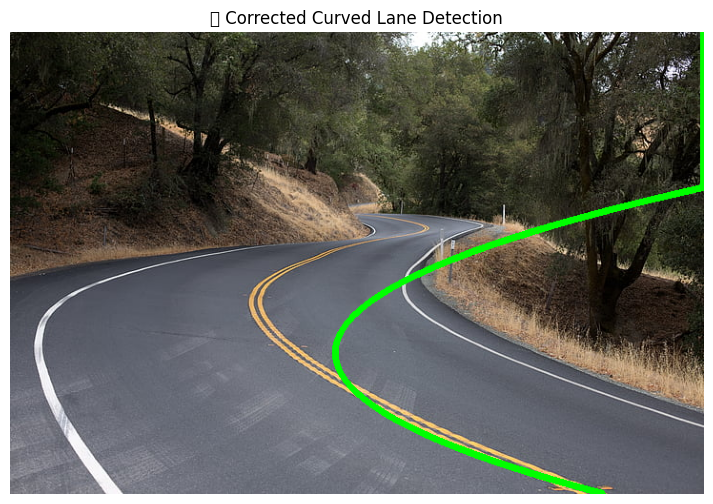

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the image
image = cv2.imread("/content/curve road image.jpg")  # Adjusted for correct path
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur for noise reduction
blurred = cv2.GaussianBlur(gray, (5, 5), 1)

# Adjusted Canny Edge Detection thresholds
low_threshold = np.median(blurred) * 0.4  # Reduced lower threshold to capture faint lines
high_threshold = np.median(blurred) * 1.6  # Adjusted upper threshold
edges = cv2.Canny(blurred, int(low_threshold), int(high_threshold))

# Define a more accurate Region of Interest (ROI)
height, width = edges.shape
mask = np.zeros_like(edges)

# Adjusted ROI polygon to better align with actual lanes
polygon = np.array([[
    (int(width * 0.15), height),  # Bottom-left (shifted slightly)
    (int(width * 0.85), height),  # Bottom-right
    (int(width * 0.55), int(height * 0.5)),  # Upper-right
    (int(width * 0.45), int(height * 0.5))   # Upper-left
]], np.int32)

cv2.fillPoly(mask, [polygon], 255)
masked_edges = cv2.bitwise_and(edges, mask)

# Find lane pixels for polynomial fitting
nonzero = masked_edges.nonzero()
nonzeroy = np.array(nonzero[0])  # y-coordinates
nonzerox = np.array(nonzero[1])  # x-coordinates

# Fit a **2nd-degree polynomial (Quadratic Curve)** for better accuracy
if len(nonzerox) > 0:
    curve_fit = np.polyfit(nonzeroy, nonzerox, 2)  # y = Ax² + Bx + C
    ploty = np.linspace(0, height - 1, height)  # Generate y values
    fitx = (curve_fit[0] * ploty**2) + (curve_fit[1] * ploty) + curve_fit[2]

    # **Smooth the lane curve** for a more natural look
    fitx = np.clip(fitx, 0, width - 1)  # Ensure values remain in image bounds

    # Draw the detected lane curve on the image
    output = image.copy()
    for i in range(len(ploty) - 1):
        cv2.line(output, (int(fitx[i]), int(ploty[i])), (int(fitx[i+1]), int(ploty[i+1])), (0, 255, 0), 5)
else:
    output = image.copy()
    print("⚠ Lane not detected properly. Adjust ROI or Canny thresholds!")

# Show the result
plt.figure(figsize=(10, 6))
plt.imshow(output)
plt.title("✅ Corrected Curved Lane Detection")
plt.axis("off")
plt.show()
